In [1]:
import time
import torch
from torch.autograd import Variable
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, models,transforms
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import TensorDataset, DataLoader,random_split
#from __future__ import print_function
import numpy as np 
import pandas as pd
import os
import random
import matplotlib.pyplot as plt 
from torch.autograd import Function
from collections import OrderedDict
import torch.nn as nn
import math
import torchvision.models as models
import pickle
import cv2
from transformers import data
import wandb
from sklearn.model_selection import KFold
# from torchsummary import summary
from datetime import timedelta

/home/anagara8/.conda/envs/pytorch/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2022-10-21 03:28:50.763629: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-21 03:28:50.895041: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-21 03:28:50.920853: E tensorflow/stream_executor/cuda/cuda_blas.cc:2

In [2]:
#MSELoss
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

def plot_vae_outputs(vae, n=10):
    plt.figure(figsize=(32,9))
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        
        img = train_set_loader.dataset[i].unsqueeze(0).cuda()
        vae.eval()
#         print("Image:", img[0], img)
        with torch.no_grad():
            enc_dec_img, mean, logvar  = vae(img)
        temp = torch.permute(img[0].cpu(), (1, 2, 0))
#         print(len(temp), len(temp[0]), len(temp[0][0]))
        
        rec_img = torch.squeeze(enc_dec_img[0]).cpu()
#         print(len(rec_img), len(rec_img[0]), len(rec_img[0][0]))
#         temp_rec_img = torch.permute(rec_img.cpu(), (1, 2, 0))
#         print("Valid Image?", valid_imshow_data(temp))
        
#         print(len(temp), len(temp[0]), len(temp[0][0]))
#         print("Image:", len(temp), len(temp[0]), len(temp[0][0]))
#         image8 = temp_rec_img.astype('uint8')
#         cv2.imwrite("Temp.png", np.array(temp_rec_img, np.int32))
        plt.imshow(temp, cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
        ax = plt.subplot(2, n, i + 1 + n)
#         plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        plt.imshow(rec_img, cmap='gist_gray')  
#         print(temp_rec_img)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
    plt.show()
    
# plot_vae_outputs(model)

In [71]:
class ResNet_VAE(nn.Module):
    def __init__(self, fc_hidden1=1024, fc_hidden2=768, drop_p=0.3, CNN_embed_dim=128):
        super(ResNet_VAE, self).__init__()

        self.fc_hidden1, self.fc_hidden2, self.CNN_embed_dim = fc_hidden1, fc_hidden2, CNN_embed_dim

        # CNN architechtures
        self.ch1, self.ch2, self.ch3, self.ch4 = 16, 32, 64, 128
        self.k1, self.k2, self.k3, self.k4 = (5, 5), (3, 3), (3, 3), (3, 3)      # 2d kernal size
        self.s1, self.s2, self.s3, self.s4 = (2, 2), (2, 2), (2, 2), (2, 2)      # 2d strides
        self.pd1, self.pd2, self.pd3, self.pd4 = (0, 0), (0, 0), (0, 0), (0, 0)  # 2d padding

        # encoding components
        resnet = models.resnet18(pretrained=True)
        modules = list(resnet.children())[:-1]      # delete the last fc layer.
        modules[0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False) # Convert 3C to 1C
        self.resnet = nn.Sequential(*modules)
        self.fc1 = nn.Linear(resnet.fc.in_features, self.fc_hidden1)
        self.bn1 = nn.BatchNorm1d(self.fc_hidden1, momentum=0.01)
        self.fc2 = nn.Linear(self.fc_hidden1, self.fc_hidden2)
        self.bn2 = nn.BatchNorm1d(self.fc_hidden2, momentum=0.01)
        # Latent vectors mu and sigma
        self.fc3_mu = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)      # output = CNN embedding latent variables
        self.fc3_logvar = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)  # output = CNN embedding latent variables

        # Sampling vector
        self.fc4 = nn.Linear(self.CNN_embed_dim, self.fc_hidden2)
        self.fc_bn4 = nn.BatchNorm1d(self.fc_hidden2)
        self.fc5 = nn.Linear(self.fc_hidden2, 64 * 4 * 4)
        self.fc_bn5 = nn.BatchNorm1d(64 * 4 * 4)
        self.relu = nn.ReLU(inplace=True)

        # Decoder
        self.convTrans6 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=self.k4, stride=self.s4,
                               padding=self.pd4),
            nn.BatchNorm2d(32, momentum=0.01),
            nn.ReLU(inplace=True),
        )
        self.convTrans7 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=32, out_channels=8, kernel_size=self.k3, stride=self.s3,
                               padding=self.pd3),
            nn.BatchNorm2d(8, momentum=0.01),
            nn.ReLU(inplace=True),
        )

        self.convTrans8 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=self.k2, stride=self.s2,
                               padding=self.pd2),
            nn.BatchNorm2d(1, momentum=0.01),
            nn.Sigmoid()    # y = (y1, y2, y3) \in [0 ,1]^3
        )


    def encode(self, x):
        x = self.resnet(x)  # ResNet
        x = x.view(x.size(0), -1)  # flatten output of conv

        # FC layers
        x = self.bn1(self.fc1(x))
        x = self.relu(x)
        x = self.bn2(self.fc2(x))
        x = self.relu(x)
        # x = F.dropout(x, p=self.drop_p, training=self.training)
        mu, logvar = self.fc3_mu(x), self.fc3_logvar(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        if self.training:
            std = logvar.mul(0.5).exp_()
            eps = Variable(std.data.new(std.size()).normal_())
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode(self, z):
        x = self.relu(self.fc_bn4(self.fc4(z)))
        x = self.relu(self.fc_bn5(self.fc5(x))).view(-1, 64, 4, 4)
        x = self.convTrans6(x)
        x = self.convTrans7(x)
        x = self.convTrans8(x)
        x = F.interpolate(x, size=(224, 224), mode='bilinear')
        return x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        x_reconst = self.decode(z)

        return x_reconst, z, mu, logvar

CNN_fc_hidden1, CNN_fc_hidden2 = 1024, 1024
CNN_embed_dim = 128   # z-size
res_size = 224        # ResNet image size
dropout_p = 0.2
vae = ResNet_VAE(fc_hidden1=CNN_fc_hidden1, fc_hidden2=CNN_fc_hidden2, drop_p=dropout_p, CNN_embed_dim=CNN_embed_dim)
vae = nn.DataParallel(vae)
vae = vae.cuda()

In [3]:
vae.load_state_dict(torch.load("croppedVAE_e1310_vL1.388850450515747.p"))

<All keys matched successfully>

In [3]:
#1C_VAE_SmoothOneBeta
class ResizeConv2d(nn.Module):

    def __init__(self, in_channels, out_channels, kernel_size, scale_factor, mode='nearest'):
        super().__init__()
        self.scale_factor = scale_factor
        self.mode = mode
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=1)

    def forward(self, x):
        x = F.interpolate(x, scale_factor=self.scale_factor, mode=self.mode)
        x = self.conv(x)
        return x

class BasicBlockEnc(nn.Module):

    def __init__(self, in_planes, stride=1):
        super().__init__()

        planes = in_planes*stride

        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        if stride == 1:
            self.shortcut = nn.Sequential()
        else:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = torch.relu(out)
        return out

class BasicBlockDec(nn.Module):

    def __init__(self, in_planes, stride=1):
        super().__init__()

        planes = int(in_planes/stride)

        self.conv2 = nn.Conv2d(in_planes, in_planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(in_planes)
        # self.bn1 could have been placed here, but that messes up the order of the layers when printing the class

        if stride == 1:
            self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
            self.bn1 = nn.BatchNorm2d(planes)
            self.shortcut = nn.Sequential()
        else:
            self.conv1 = ResizeConv2d(in_planes, planes, kernel_size=3, scale_factor=stride)
            self.bn1 = nn.BatchNorm2d(planes)
            self.shortcut = nn.Sequential(
                ResizeConv2d(in_planes, planes, kernel_size=3, scale_factor=stride),
                nn.BatchNorm2d(planes)
            )

    def forward(self, x):
        out = torch.relu(self.bn2(self.conv2(x)))
        out = self.bn1(self.conv1(out))
        out += self.shortcut(x)
        out = torch.relu(out)
        return out

class ResNet18Enc(nn.Module):
    def __init__(self, z_dim=256):
        super(ResNet18Enc, self).__init__()
        self.z_dim = z_dim
        self.ResNet18 = models.resnet18(pretrained=True)
        self.num_feature = self.ResNet18.fc.in_features
        initial_conv1 = self.ResNet18.conv1
        self.ResNet18.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False) # Convert 3C to 1C
        self.ResNet18.conv1.weight = nn.Parameter(torch.unsqueeze(initial_conv1.weight[:, 0, :, :], 1))
        self.ResNet18.fc = nn.Linear(self.num_feature, 2*self.z_dim)
        
    def forward(self, x):
        x = self.ResNet18(x)
        mu = x[:, :self.z_dim]
        logvar = x[:, self.z_dim:]
        return mu, logvar

class ResNet18Dec(nn.Module):

    def __init__(self, num_Blocks=[2,2,2,2], z_dim=10, nc=1):
        super().__init__()
        self.in_planes = 512

        self.linear = nn.Linear(z_dim, 512)

        self.layer4 = self._make_layer(BasicBlockDec, 256, num_Blocks[3], stride=2)
        self.layer3 = self._make_layer(BasicBlockDec, 128, num_Blocks[2], stride=2)
        self.layer2 = self._make_layer(BasicBlockDec, 64, num_Blocks[1], stride=2)
        self.layer1 = self._make_layer(BasicBlockDec, 64, num_Blocks[0], stride=1)
        self.conv1 = ResizeConv2d(64, nc, kernel_size=3, scale_factor=2)

    def _make_layer(self, BasicBlockDec, planes, num_Blocks, stride):
        strides = [stride] + [1]*(num_Blocks-1)
        layers = []
        for stride in reversed(strides):
            layers += [BasicBlockDec(self.in_planes, stride)]
        self.in_planes = planes
        return nn.Sequential(*layers)

    def forward(self, z):
        x = self.linear(z)
        x = x.view(z.size(0), 512, 1, 1)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer4(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer3(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer2(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer1(x)
        x = F.interpolate(x, size=(112,112), mode='bilinear')
        x = torch.sigmoid(self.conv1(x))
        x = x.view(x.size(0), 1, 224, 224)
        return x
    
class VAE(nn.Module):

    def __init__(self, z_dim):
        super().__init__()
        self.encoder = ResNet18Enc(z_dim=z_dim)
        self.decoder = ResNet18Dec(z_dim=z_dim)

    def forward(self, x):
#         print("Args", len(self.encoder(x)))
#         print("EncO/P:", self.encoder(x))
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        r = self.decoder(z)
        return r, mu, logvar
    
    @staticmethod
    def reparameterize(mean, logvar):
        std = torch.exp(logvar / 2) # in log-space, squareroot is divide by two
        epsilon = torch.randn_like(std)
        return epsilon * std + mean

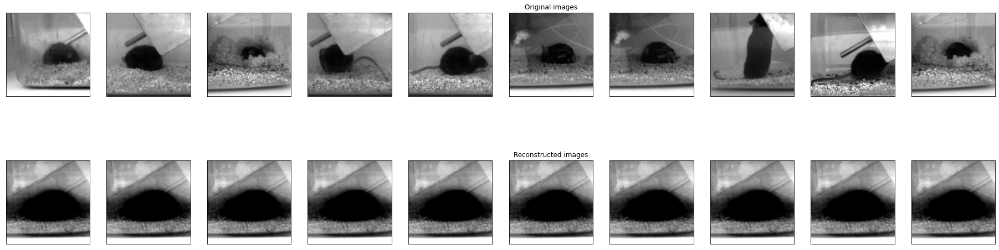

In [20]:
# 50 Epochs
# 1C_VAE_SmoothOneBeta_e50_vL364.0641774535179.p

zsize = 256
vae = VAE(zsize)
vae = nn.DataParallel(vae)
vae = vae.cuda()

vae.load_state_dict(torch.load("1C_VAE_SmoothOneBeta_e50_vL364.0641774535179.p"))
plot_vae_outputs(vae)

In [17]:
print("Traversing Image Directory..")
img_list = np.load("/media/data_cifs/anagara8/smoothed_tracking_img_list.npy") # os.listdir(data_dir)
img_list = img_list[:1024]
print("Done!")


mean = [0.485]  # Resnet
std = [0.229]
transform_norm = transforms.Compose([
    transforms.Normalize(mean, std)
])


class MyDataset(torch.utils.data.Dataset):
    def __init__(self, img_list, augmentations = None):
        super(MyDataset, self).__init__()
        self.img_list = img_list
        self.augmentations = augmentations
    
    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_name = self.img_list[idx]
        img = cv2.imread("/media/data_cifs/anagara8/final_smooth_video_processed_frames/"+img_name)
        img = img[:, :, 0]

        img = torch.tensor(img).float()/255.0
        img = torch.unsqueeze(img, 0)
        img = transform_norm(img)
        return img

m=len(img_list)

print("Length:",m, "-> Training set size:", int(math.ceil(m-m*0.2)), "| Validation set size:", int(m*0.2))
train_data, val_data = random_split(img_list, [int(math.ceil(m-m*0.2)), int(m*0.2)])


batch_size=4
train_set_loader = torch.utils.data.DataLoader(MyDataset(train_data), batch_size=batch_size, num_workers = 4, shuffle=True)
valid_set_loader = torch.utils.data.DataLoader(MyDataset(val_data), batch_size=batch_size, num_workers = 4, shuffle=True)
# test_set_loader = torch.utils.data.DataLoader(MyDataset(test_dataset_list), batch_size=batch_size,shuffle=True, num_workers = 4)
print("Converted to DataLoader")


Traversing Image Directory..
Done!
Length: 1024 -> Training set size: 820 | Validation set size: 204
Converted to DataLoader


In [5]:
for image_batch in train_set_loader:
    enc_dec_img, z, mean, logvar = vae(image_batch)
    break

/home/anagara8/.conda/envs/pytorch/lib/python3.9/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


In [160]:
#MSELoss
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

def plot_vae_outputs(vae, n=10):
    plt.figure(figsize=(32,9))
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        
        img = train_set_loader.dataset[i].unsqueeze(0).cuda()
        vae.eval()
#         print("Image:", img[0], img)
        with torch.no_grad():
            enc_dec_img, z, mean, logvar  = vae(img)
        temp = torch.permute(img[0].cpu(), (1, 2, 0))
#         print(len(temp), len(temp[0]), len(temp[0][0]))
        
        rec_img = torch.squeeze(enc_dec_img[0]).cpu()
#         print(len(rec_img), len(rec_img[0]), len(rec_img[0][0]))
#         temp_rec_img = torch.permute(rec_img.cpu(), (1, 2, 0))
#         print("Valid Image?", valid_imshow_data(temp))
        
#         print(len(temp), len(temp[0]), len(temp[0][0]))
#         print("Image:", len(temp), len(temp[0]), len(temp[0][0]))
#         image8 = temp_rec_img.astype('uint8')
#         cv2.imwrite("Temp.png", np.array(temp_rec_img, np.int32))
        plt.imshow(temp, cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
        ax = plt.subplot(2, n, i + 1 + n)
#         plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        plt.imshow(rec_img, cmap='gist_gray')  
#         print(temp_rec_img)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
    plt.show()
    
# plot_vae_outputs(model)

In [169]:
def plot_ae_outputs(vae, n=10):
    plt.figure(figsize=(32,9))
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        
        img = train_set_loader.dataset[i].unsqueeze(0).cuda()
        vae.eval()
#         print("Image:", img[0], img)
        with torch.no_grad():
            enc_dec_img = vae(img)
        temp = torch.permute(img[0].cpu(), (1, 2, 0))
#         print(len(temp), len(temp[0]), len(temp[0][0]))
        
        rec_img = torch.squeeze(enc_dec_img[0]).cpu()
#         print(len(rec_img), len(rec_img[0]), len(rec_img[0][0]))
#         temp_rec_img = torch.permute(rec_img.cpu(), (1, 2, 0))
#         print("Valid Image?", valid_imshow_data(temp))
        
#         print(len(temp), len(temp[0]), len(temp[0][0]))
#         print("Image:", len(temp), len(temp[0]), len(temp[0][0]))
#         image8 = temp_rec_img.astype('uint8')
#         cv2.imwrite("Temp.png", np.array(temp_rec_img, np.int32))
        plt.imshow(temp, cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
        ax = plt.subplot(2, n, i + 1 + n)
#         plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        plt.imshow(rec_img, cmap='gist_gray')  
#         print(temp_rec_img)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
    plt.show()

In [82]:
class ResNet_VAE(nn.Module):
    def __init__(self, fc_hidden1=1024, fc_hidden2=768, drop_p=0.3, CNN_embed_dim=128):
        super(ResNet_VAE, self).__init__()

        self.fc_hidden1, self.fc_hidden2, self.CNN_embed_dim = fc_hidden1, fc_hidden2, CNN_embed_dim

        # CNN architechtures
        self.ch1, self.ch2, self.ch3, self.ch4 = 16, 32, 64, 128
        self.k1, self.k2, self.k3, self.k4 = (5, 5), (3, 3), (3, 3), (3, 3)      # 2d kernal size
        self.s1, self.s2, self.s3, self.s4 = (2, 2), (2, 2), (2, 2), (2, 2)      # 2d strides
        self.pd1, self.pd2, self.pd3, self.pd4 = (0, 0), (0, 0), (0, 0), (0, 0)  # 2d padding

        # encoding components
        resnet = models.resnet18(pretrained=True)
        modules = list(resnet.children())[:-1]      # delete the last fc layer.
        conv1_weight = modules[0].weight # getting the weights of conv1
        modules[0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False) # C>
        modules[0].weight = nn.Parameter(torch.mean(conv1_weight, dim=1, keepdim=True))
        self.resnet = nn.Sequential(*modules)
        self.fc1 = nn.Linear(resnet.fc.in_features, self.fc_hidden1)
        self.bn1 = nn.BatchNorm1d(self.fc_hidden1, momentum=0.01)
        self.fc2 = nn.Linear(self.fc_hidden1, self.fc_hidden2)
        self.bn2 = nn.BatchNorm1d(self.fc_hidden2, momentum=0.01)
        # Latent vectors mu and sigma
        self.fc3_mu = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)      # output = CNN embedding laten>
        self.fc3_logvar = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)  # output = CNN embedding laten>

        # Sampling vector
        self.fc4 = nn.Linear(self.CNN_embed_dim, self.fc_hidden2)
        self.fc_bn4 = nn.BatchNorm1d(self.fc_hidden2)
        self.fc5 = nn.Linear(self.fc_hidden2, 64 * 4 * 4)
        self.fc_bn5 = nn.BatchNorm1d(64 * 4 * 4)
        self.relu = nn.ReLU(inplace=True)

        # Decoder
        self.convTrans6 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=self.k4, stride=self.s4,
                               padding=self.pd4),
            nn.BatchNorm2d(32, momentum=0.01),
            nn.ReLU(inplace=True),
        )
        self.convTrans7 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=32, out_channels=8, kernel_size=self.k3, stride=self.s3,
                               padding=self.pd3),
            nn.BatchNorm2d(8, momentum=0.01),
            nn.ReLU(inplace=True),
        )

        self.convTrans8 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=self.k2, stride=self.s2,
                               padding=self.pd2),
            nn.BatchNorm2d(1, momentum=0.01),
            nn.Sigmoid()    # y = (y1, y2, y3) \in [0 ,1]^3
        )
        
    def encode(self, x):
        x = self.resnet(x)  # ResNet
        x = x.view(x.size(0), -1)  # flatten output of conv

        # FC layers
        x = self.bn1(self.fc1(x))
        x = self.relu(x)
        x = self.bn2(self.fc2(x))
        x = self.relu(x)
        # x = F.dropout(x, p=self.drop_p, training=self.training)
        mu, logvar = self.fc3_mu(x), self.fc3_logvar(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        if self.training:
            std = logvar.mul(0.5).exp_()
            eps = Variable(std.data.new(std.size()).normal_())
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode(self, z):
        x = self.relu(self.fc_bn4(self.fc4(z)))
        x = self.relu(self.fc_bn5(self.fc5(x))).view(-1, 64, 4, 4)
        x = self.convTrans6(x)
        x = self.convTrans7(x)
        x = self.convTrans8(x)
        x = F.interpolate(x, size=(224, 224), mode='bilinear')
        return x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        x_reconst = self.decode(z)

        return x_reconst, z, mu, logvar

CNN_fc_hidden1, CNN_fc_hidden2 = 1024, 1024
CNN_embed_dim = 128   # z-size
res_size = 224        # ResNet image size
dropout_p = 0.2
vae = ResNet_VAE(fc_hidden1=CNN_fc_hidden1, fc_hidden2=CNN_fc_hidden2, drop_p=dropout_p, CNN_embed_dim=CNN_embed_dim)
vae = nn.DataParallel(vae)
vae = vae.cuda()

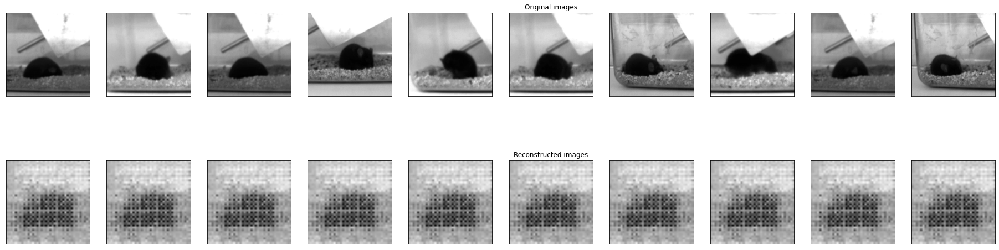

In [27]:
plot_vae_outputs(vae)

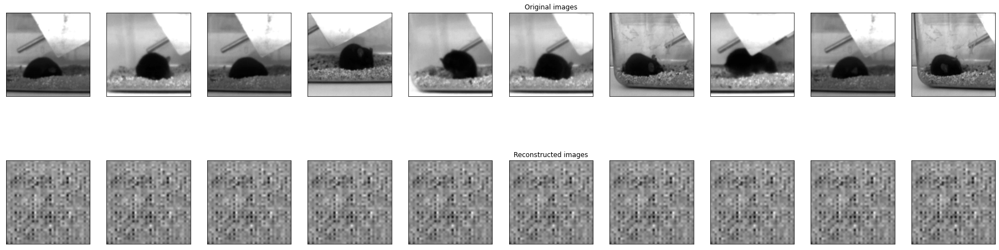

In [28]:
vae.load_state_dict(torch.load("croppedVAE_e100_vL34.55010223388672.p"))
plot_vae_outputs(vae)

In [63]:
!ls croppedVAE*

croppedVAE_e1000_vL1.7685472965240479.p
croppedVAE_e100_vL34.55010223388672.p
croppedVAE_e1310_vL1.388850450515747.p
croppedVAE_e1500_vL1.5559903383255005.p
croppedVAE_e2000_vL1.323075294494629.p
croppedVAE_e200_vL16.59771156311035.p
croppedVAE_e2010_vL0.7712467312812805.p
croppedVAE_e2320_vL0.3434304893016815.p
croppedVAE_e2430_vL0.4642226994037628.p
croppedVAE_e2500_vL0.5254085063934326.p
croppedVAE_e3000_vL0.35261058807373047.p
croppedVAE_e3900_vL1.6611363887786865.p
croppedVAE_e500_vL5.191926956176758.p


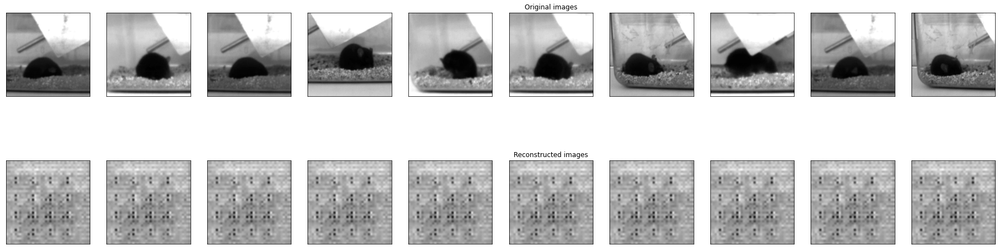

In [64]:
vae.load_state_dict(torch.load("croppedVAE_e500_vL5.191926956176758.p"))
plot_vae_outputs(vae)

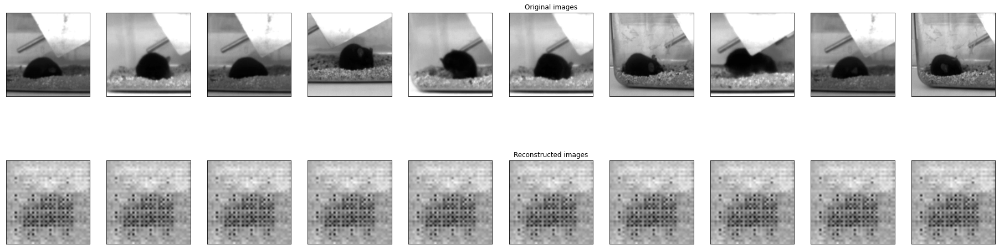

In [65]:
vae.load_state_dict(torch.load("croppedVAE_e1000_vL1.7685472965240479.p"))
plot_vae_outputs(vae)

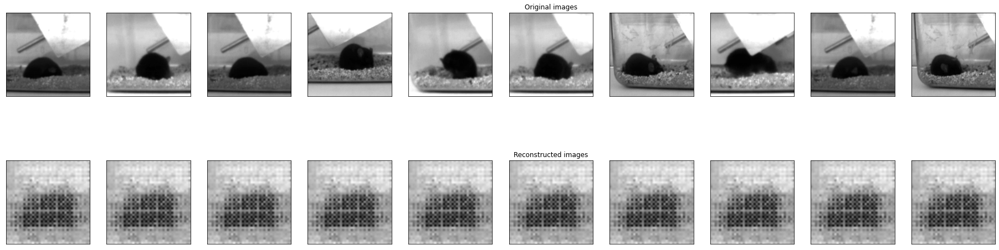

In [66]:
vae.load_state_dict(torch.load("croppedVAE_e1500_vL1.5559903383255005.p"))
plot_vae_outputs(vae)

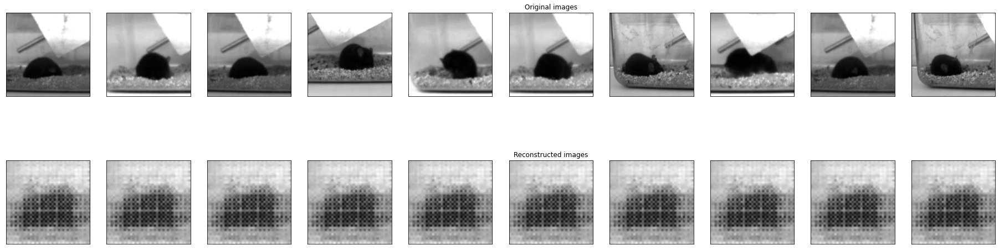

In [67]:
vae.load_state_dict(torch.load("croppedVAE_e2000_vL1.323075294494629.p"))
plot_vae_outputs(vae)

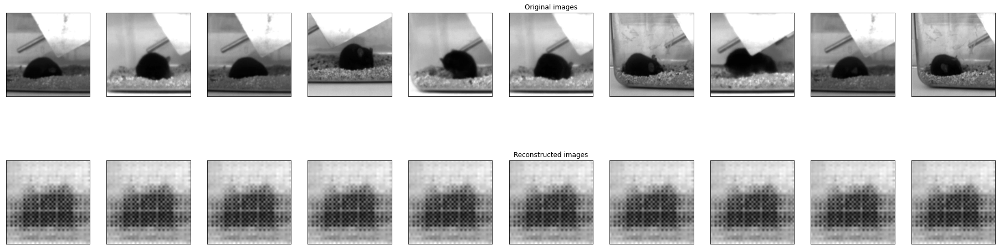

In [68]:
vae.load_state_dict(torch.load("croppedVAE_e2500_vL0.5254085063934326.p"))
plot_vae_outputs(vae)

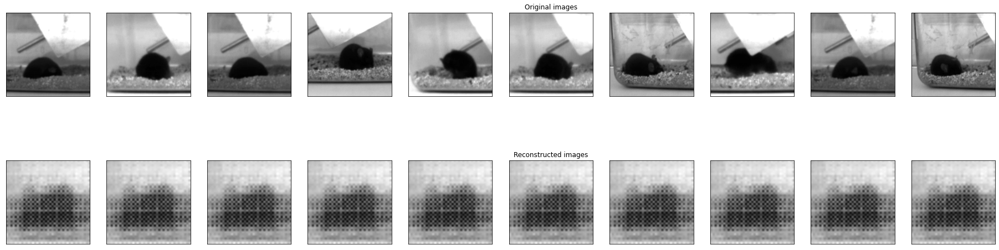

In [69]:
vae.load_state_dict(torch.load("croppedVAE_e3000_vL0.35261058807373047.p"))
plot_vae_outputs(vae)

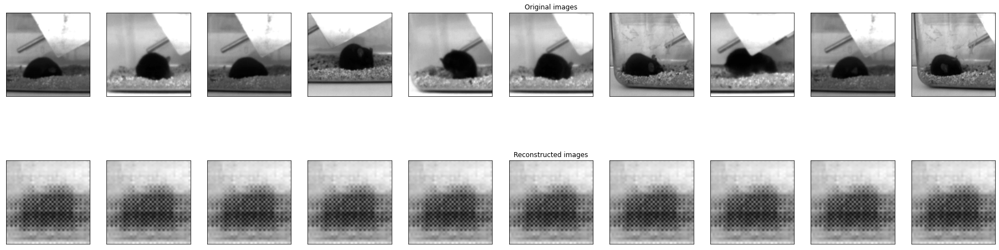

In [70]:
vae.load_state_dict(torch.load("croppedVAE_e3900_vL1.6611363887786865.p"))
plot_vae_outputs(vae)

In [72]:
!ls ResNet18crop*

ResNet18croppedVAE_e1000_vL102.07170724868774.p
ResNet18croppedVAE_e1250_vL26.57903802394867.p
ResNet18croppedVAE_e1500_vL66.05923467874527.p
ResNet18croppedVAE_e2000_vL21.389259219169617.p
ResNet18croppedVAE_e2500_vL54.605668783187866.p
ResNet18croppedVAE_e3000_vL3.6146073192358017.p
ResNet18croppedVAE_e3500_vL11.518774807453156.p
ResNet18croppedVAE_e3900_vL16.245522677898407.p
ResNet18croppedVAE_e3950_vL5.642994925379753.p
ResNet18croppedVAE_e500_vL71.01489281654358.p


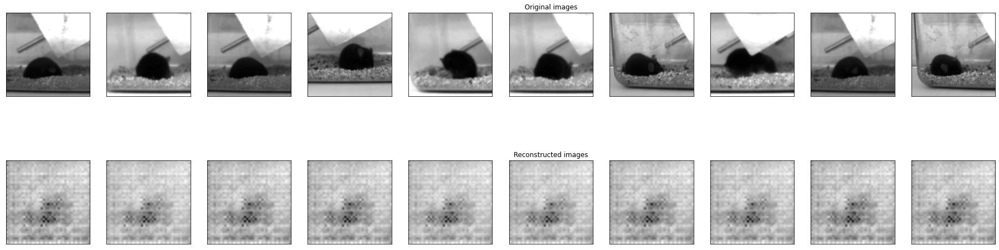

In [73]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e500_vL71.01489281654358.p"))
plot_vae_outputs(vae)

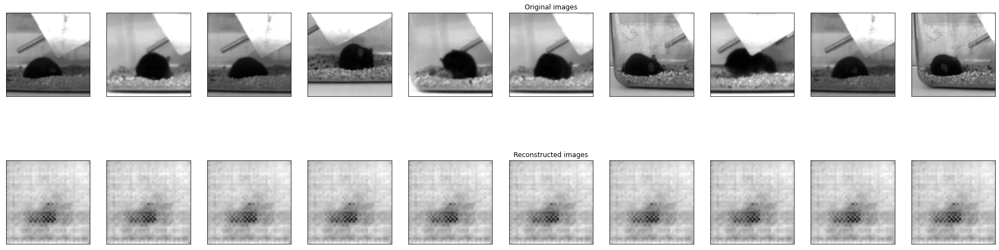

In [74]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e1000_vL102.07170724868774.p"))
plot_vae_outputs(vae)

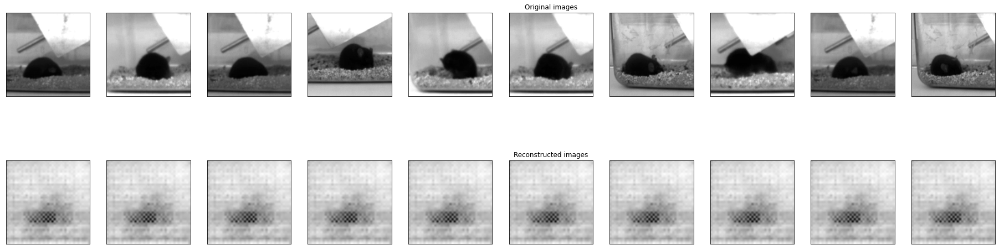

In [75]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e1500_vL66.05923467874527.p"))
plot_vae_outputs(vae)

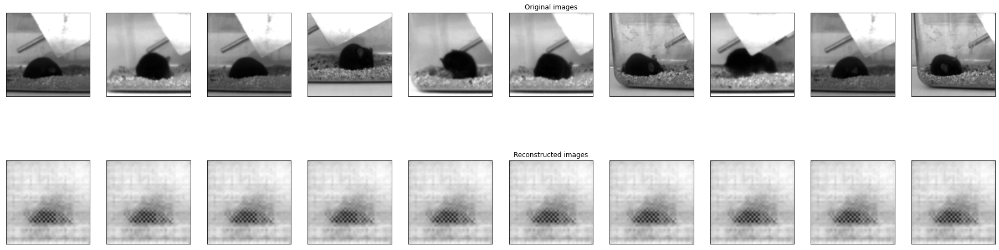

In [76]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e2000_vL21.389259219169617.p"))
plot_vae_outputs(vae)

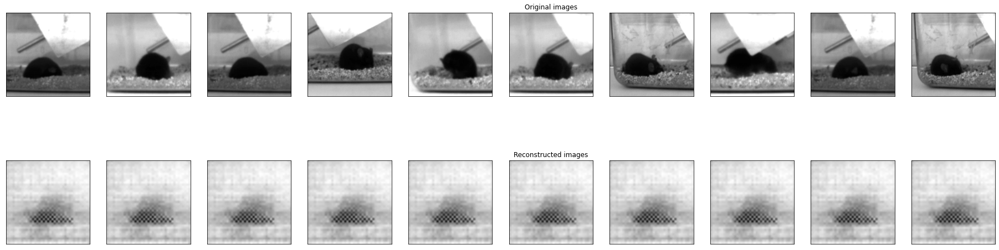

In [77]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e2500_vL54.605668783187866.p"))
plot_vae_outputs(vae)

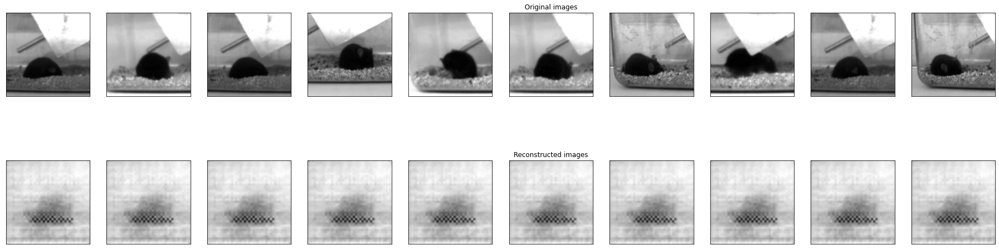

In [78]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e3000_vL3.6146073192358017.p"))
plot_vae_outputs(vae)

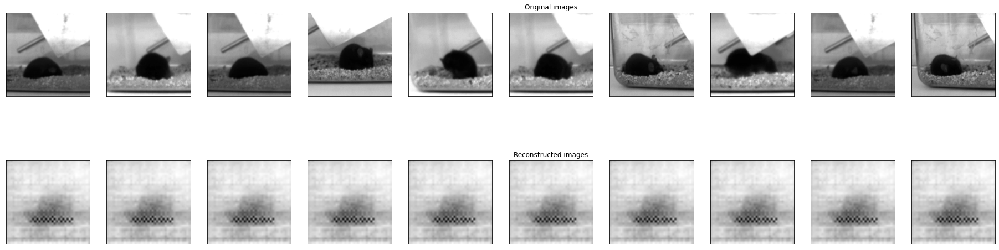

In [79]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e3500_vL11.518774807453156.p"))
plot_vae_outputs(vae)

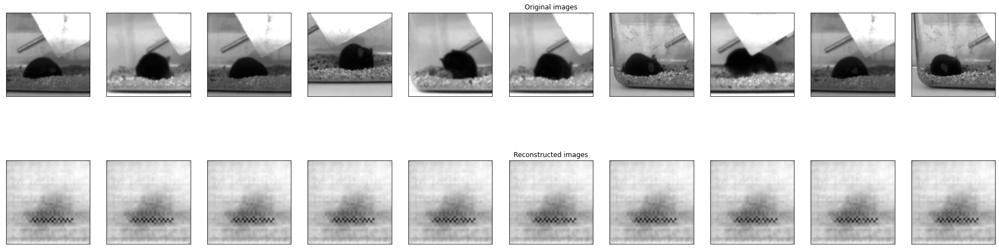

In [80]:
vae.load_state_dict(torch.load("ResNet18croppedVAE_e3900_vL16.245522677898407.p"))
plot_vae_outputs(vae)

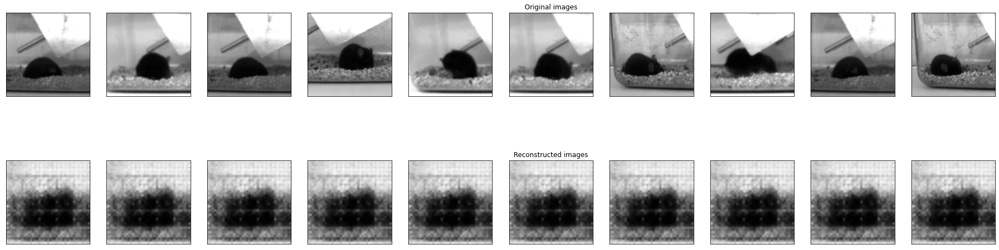

In [84]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e500_vL4.064389169216156.p"))
plot_vae_outputs(vae)

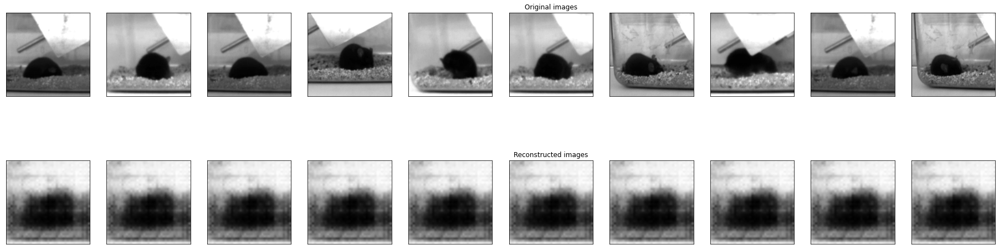

In [85]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e1000_vL3.0244340300559998.p"))
plot_vae_outputs(vae)

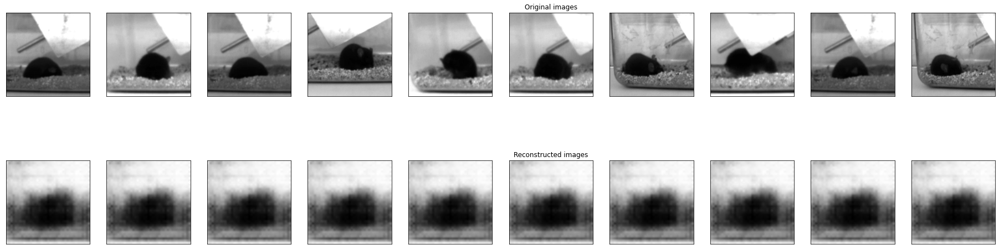

In [86]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e1500_vL2.869375705718994.p"))
plot_vae_outputs(vae)

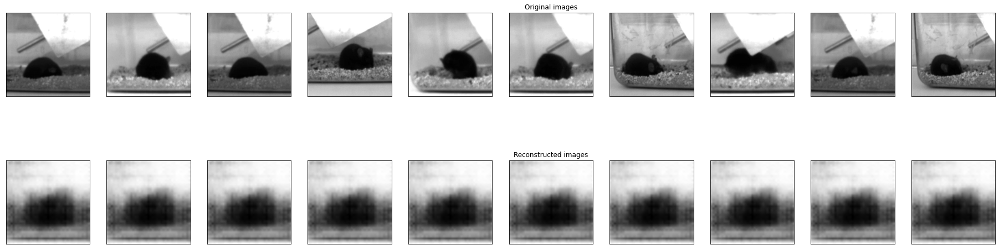

In [87]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e2000_vL2.879939079284668.p"))
plot_vae_outputs(vae)

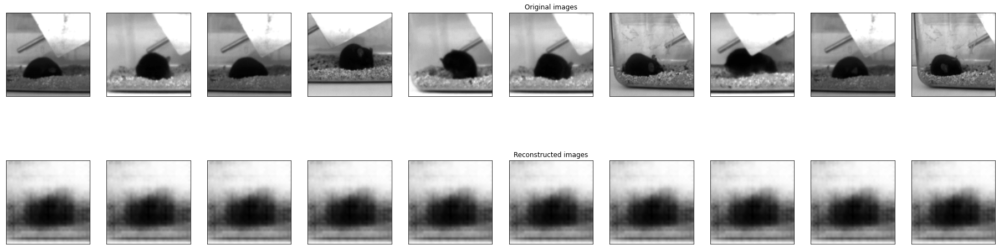

In [88]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e2500_vL2.7999218106269836.p"))
plot_vae_outputs(vae)

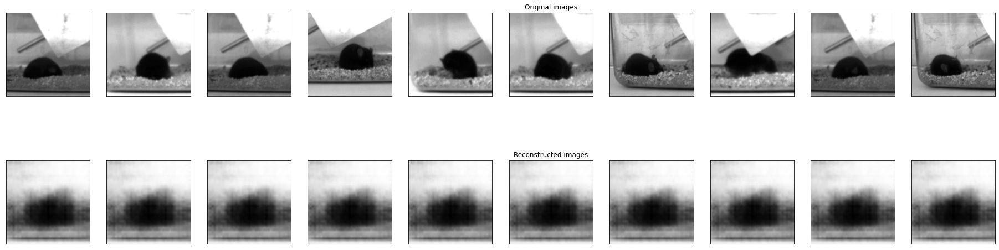

In [89]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e3000_vL2.719068169593811.p"))
plot_vae_outputs(vae)

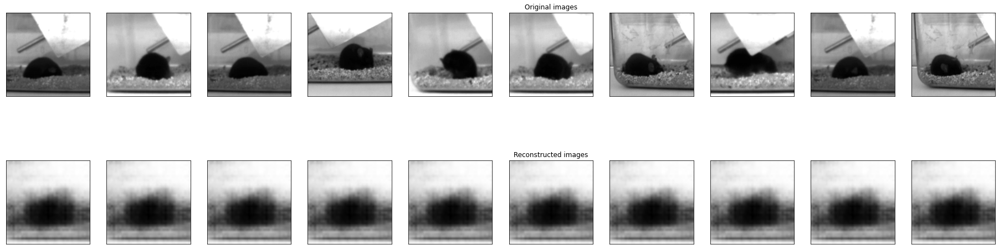

In [92]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e3500_vL2.7560291290283203.p"))
plot_vae_outputs(vae)

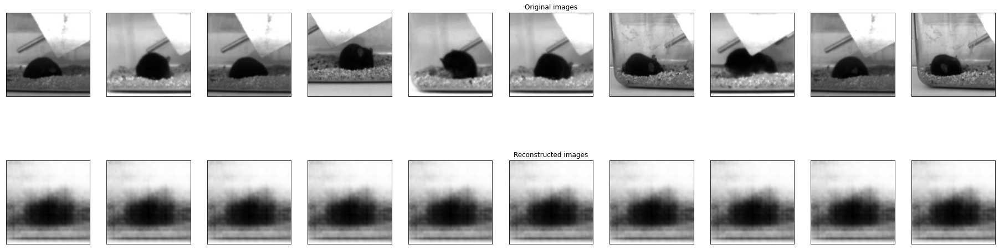

In [93]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedVAE_e3900_vL2.687773108482361.p"))
plot_vae_outputs(vae)

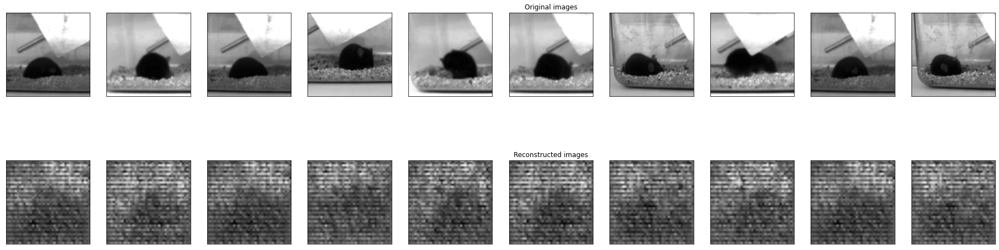

In [100]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e500_vL0.8519065976142883.p"))
plot_ae_outputs(vae)

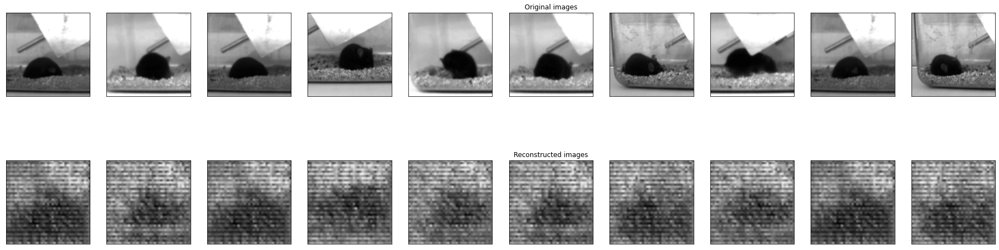

In [102]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e1000_vL0.7772133946418762.p"))
plot_ae_outputs(vae)

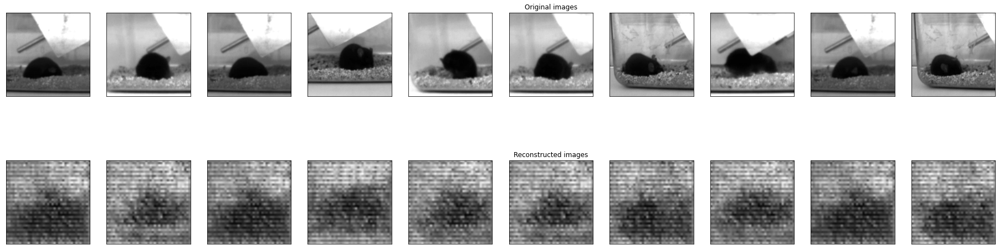

In [104]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e1500_vL0.7449577450752258.p"))
plot_ae_outputs(vae)

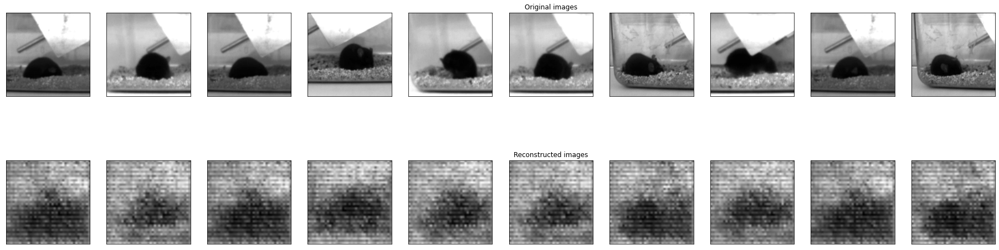

In [105]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e2000_vL0.7225696444511414.p"))
plot_ae_outputs(vae)

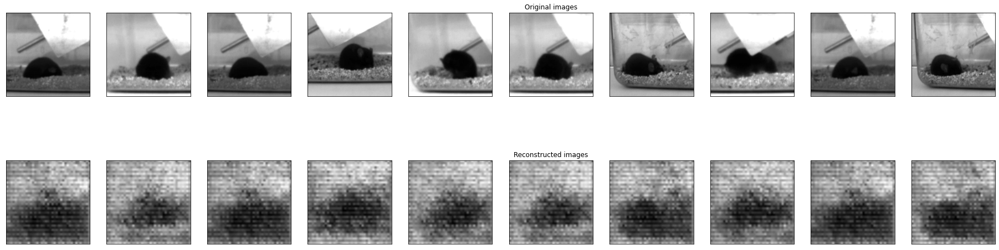

In [107]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e2500_vL0.7054354548454285.p"))
plot_ae_outputs(vae)

In [ ]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e2000_vL0.7225696444511414.p"))
plot_ae_outputs(vae)

In [ ]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e2000_vL0.7225696444511414.p"))
plot_ae_outputs(vae)

In [146]:
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAE_e2000_vL0.7225696444511414.p"))
plot_vae_outputs(vae)

RuntimeError: Error(s) in loading state_dict for VAE:
	Missing key(s) in state_dict: "encoder.ResNet18.conv1.weight", "encoder.ResNet18.bn1.weight", "encoder.ResNet18.bn1.bias", "encoder.ResNet18.bn1.running_mean", "encoder.ResNet18.bn1.running_var", "encoder.ResNet18.layer1.0.conv1.weight", "encoder.ResNet18.layer1.0.bn1.weight", "encoder.ResNet18.layer1.0.bn1.bias", "encoder.ResNet18.layer1.0.bn1.running_mean", "encoder.ResNet18.layer1.0.bn1.running_var", "encoder.ResNet18.layer1.0.conv2.weight", "encoder.ResNet18.layer1.0.bn2.weight", "encoder.ResNet18.layer1.0.bn2.bias", "encoder.ResNet18.layer1.0.bn2.running_mean", "encoder.ResNet18.layer1.0.bn2.running_var", "encoder.ResNet18.layer1.1.conv1.weight", "encoder.ResNet18.layer1.1.bn1.weight", "encoder.ResNet18.layer1.1.bn1.bias", "encoder.ResNet18.layer1.1.bn1.running_mean", "encoder.ResNet18.layer1.1.bn1.running_var", "encoder.ResNet18.layer1.1.conv2.weight", "encoder.ResNet18.layer1.1.bn2.weight", "encoder.ResNet18.layer1.1.bn2.bias", "encoder.ResNet18.layer1.1.bn2.running_mean", "encoder.ResNet18.layer1.1.bn2.running_var", "encoder.ResNet18.layer2.0.conv1.weight", "encoder.ResNet18.layer2.0.bn1.weight", "encoder.ResNet18.layer2.0.bn1.bias", "encoder.ResNet18.layer2.0.bn1.running_mean", "encoder.ResNet18.layer2.0.bn1.running_var", "encoder.ResNet18.layer2.0.conv2.weight", "encoder.ResNet18.layer2.0.bn2.weight", "encoder.ResNet18.layer2.0.bn2.bias", "encoder.ResNet18.layer2.0.bn2.running_mean", "encoder.ResNet18.layer2.0.bn2.running_var", "encoder.ResNet18.layer2.0.downsample.0.weight", "encoder.ResNet18.layer2.0.downsample.1.weight", "encoder.ResNet18.layer2.0.downsample.1.bias", "encoder.ResNet18.layer2.0.downsample.1.running_mean", "encoder.ResNet18.layer2.0.downsample.1.running_var", "encoder.ResNet18.layer2.1.conv1.weight", "encoder.ResNet18.layer2.1.bn1.weight", "encoder.ResNet18.layer2.1.bn1.bias", "encoder.ResNet18.layer2.1.bn1.running_mean", "encoder.ResNet18.layer2.1.bn1.running_var", "encoder.ResNet18.layer2.1.conv2.weight", "encoder.ResNet18.layer2.1.bn2.weight", "encoder.ResNet18.layer2.1.bn2.bias", "encoder.ResNet18.layer2.1.bn2.running_mean", "encoder.ResNet18.layer2.1.bn2.running_var", "encoder.ResNet18.layer3.0.conv1.weight", "encoder.ResNet18.layer3.0.bn1.weight", "encoder.ResNet18.layer3.0.bn1.bias", "encoder.ResNet18.layer3.0.bn1.running_mean", "encoder.ResNet18.layer3.0.bn1.running_var", "encoder.ResNet18.layer3.0.conv2.weight", "encoder.ResNet18.layer3.0.bn2.weight", "encoder.ResNet18.layer3.0.bn2.bias", "encoder.ResNet18.layer3.0.bn2.running_mean", "encoder.ResNet18.layer3.0.bn2.running_var", "encoder.ResNet18.layer3.0.downsample.0.weight", "encoder.ResNet18.layer3.0.downsample.1.weight", "encoder.ResNet18.layer3.0.downsample.1.bias", "encoder.ResNet18.layer3.0.downsample.1.running_mean", "encoder.ResNet18.layer3.0.downsample.1.running_var", "encoder.ResNet18.layer3.1.conv1.weight", "encoder.ResNet18.layer3.1.bn1.weight", "encoder.ResNet18.layer3.1.bn1.bias", "encoder.ResNet18.layer3.1.bn1.running_mean", "encoder.ResNet18.layer3.1.bn1.running_var", "encoder.ResNet18.layer3.1.conv2.weight", "encoder.ResNet18.layer3.1.bn2.weight", "encoder.ResNet18.layer3.1.bn2.bias", "encoder.ResNet18.layer3.1.bn2.running_mean", "encoder.ResNet18.layer3.1.bn2.running_var", "encoder.ResNet18.layer4.0.conv1.weight", "encoder.ResNet18.layer4.0.bn1.weight", "encoder.ResNet18.layer4.0.bn1.bias", "encoder.ResNet18.layer4.0.bn1.running_mean", "encoder.ResNet18.layer4.0.bn1.running_var", "encoder.ResNet18.layer4.0.conv2.weight", "encoder.ResNet18.layer4.0.bn2.weight", "encoder.ResNet18.layer4.0.bn2.bias", "encoder.ResNet18.layer4.0.bn2.running_mean", "encoder.ResNet18.layer4.0.bn2.running_var", "encoder.ResNet18.layer4.0.downsample.0.weight", "encoder.ResNet18.layer4.0.downsample.1.weight", "encoder.ResNet18.layer4.0.downsample.1.bias", "encoder.ResNet18.layer4.0.downsample.1.running_mean", "encoder.ResNet18.layer4.0.downsample.1.running_var", "encoder.ResNet18.layer4.1.conv1.weight", "encoder.ResNet18.layer4.1.bn1.weight", "encoder.ResNet18.layer4.1.bn1.bias", "encoder.ResNet18.layer4.1.bn1.running_mean", "encoder.ResNet18.layer4.1.bn1.running_var", "encoder.ResNet18.layer4.1.conv2.weight", "encoder.ResNet18.layer4.1.bn2.weight", "encoder.ResNet18.layer4.1.bn2.bias", "encoder.ResNet18.layer4.1.bn2.running_mean", "encoder.ResNet18.layer4.1.bn2.running_var", "encoder.ResNet18.fc.weight", "encoder.ResNet18.fc.bias", "decoder.linear.weight", "decoder.linear.bias", "decoder.layer4.0.conv2.weight", "decoder.layer4.0.bn2.weight", "decoder.layer4.0.bn2.bias", "decoder.layer4.0.bn2.running_mean", "decoder.layer4.0.bn2.running_var", "decoder.layer4.0.conv1.weight", "decoder.layer4.0.bn1.weight", "decoder.layer4.0.bn1.bias", "decoder.layer4.0.bn1.running_mean", "decoder.layer4.0.bn1.running_var", "decoder.layer4.1.conv2.weight", "decoder.layer4.1.bn2.weight", "decoder.layer4.1.bn2.bias", "decoder.layer4.1.bn2.running_mean", "decoder.layer4.1.bn2.running_var", "decoder.layer4.1.conv1.conv.weight", "decoder.layer4.1.conv1.conv.bias", "decoder.layer4.1.bn1.weight", "decoder.layer4.1.bn1.bias", "decoder.layer4.1.bn1.running_mean", "decoder.layer4.1.bn1.running_var", "decoder.layer4.1.shortcut.0.conv.weight", "decoder.layer4.1.shortcut.0.conv.bias", "decoder.layer4.1.shortcut.1.weight", "decoder.layer4.1.shortcut.1.bias", "decoder.layer4.1.shortcut.1.running_mean", "decoder.layer4.1.shortcut.1.running_var", "decoder.layer3.0.conv2.weight", "decoder.layer3.0.bn2.weight", "decoder.layer3.0.bn2.bias", "decoder.layer3.0.bn2.running_mean", "decoder.layer3.0.bn2.running_var", "decoder.layer3.0.conv1.weight", "decoder.layer3.0.bn1.weight", "decoder.layer3.0.bn1.bias", "decoder.layer3.0.bn1.running_mean", "decoder.layer3.0.bn1.running_var", "decoder.layer3.1.conv2.weight", "decoder.layer3.1.bn2.weight", "decoder.layer3.1.bn2.bias", "decoder.layer3.1.bn2.running_mean", "decoder.layer3.1.bn2.running_var", "decoder.layer3.1.conv1.conv.weight", "decoder.layer3.1.conv1.conv.bias", "decoder.layer3.1.bn1.weight", "decoder.layer3.1.bn1.bias", "decoder.layer3.1.bn1.running_mean", "decoder.layer3.1.bn1.running_var", "decoder.layer3.1.shortcut.0.conv.weight", "decoder.layer3.1.shortcut.0.conv.bias", "decoder.layer3.1.shortcut.1.weight", "decoder.layer3.1.shortcut.1.bias", "decoder.layer3.1.shortcut.1.running_mean", "decoder.layer3.1.shortcut.1.running_var", "decoder.layer2.0.conv2.weight", "decoder.layer2.0.bn2.weight", "decoder.layer2.0.bn2.bias", "decoder.layer2.0.bn2.running_mean", "decoder.layer2.0.bn2.running_var", "decoder.layer2.0.conv1.weight", "decoder.layer2.0.bn1.weight", "decoder.layer2.0.bn1.bias", "decoder.layer2.0.bn1.running_mean", "decoder.layer2.0.bn1.running_var", "decoder.layer2.1.conv2.weight", "decoder.layer2.1.bn2.weight", "decoder.layer2.1.bn2.bias", "decoder.layer2.1.bn2.running_mean", "decoder.layer2.1.bn2.running_var", "decoder.layer2.1.conv1.conv.weight", "decoder.layer2.1.conv1.conv.bias", "decoder.layer2.1.bn1.weight", "decoder.layer2.1.bn1.bias", "decoder.layer2.1.bn1.running_mean", "decoder.layer2.1.bn1.running_var", "decoder.layer2.1.shortcut.0.conv.weight", "decoder.layer2.1.shortcut.0.conv.bias", "decoder.layer2.1.shortcut.1.weight", "decoder.layer2.1.shortcut.1.bias", "decoder.layer2.1.shortcut.1.running_mean", "decoder.layer2.1.shortcut.1.running_var", "decoder.layer1.0.conv2.weight", "decoder.layer1.0.bn2.weight", "decoder.layer1.0.bn2.bias", "decoder.layer1.0.bn2.running_mean", "decoder.layer1.0.bn2.running_var", "decoder.layer1.0.conv1.weight", "decoder.layer1.0.bn1.weight", "decoder.layer1.0.bn1.bias", "decoder.layer1.0.bn1.running_mean", "decoder.layer1.0.bn1.running_var", "decoder.layer1.1.conv2.weight", "decoder.layer1.1.bn2.weight", "decoder.layer1.1.bn2.bias", "decoder.layer1.1.bn2.running_mean", "decoder.layer1.1.bn2.running_var", "decoder.layer1.1.conv1.weight", "decoder.layer1.1.bn1.weight", "decoder.layer1.1.bn1.bias", "decoder.layer1.1.bn1.running_mean", "decoder.layer1.1.bn1.running_var", "decoder.conv1.conv.weight", "decoder.conv1.conv.bias". 
	Unexpected key(s) in state_dict: "module.resnet.0.weight", "module.resnet.1.weight", "module.resnet.1.bias", "module.resnet.1.running_mean", "module.resnet.1.running_var", "module.resnet.1.num_batches_tracked", "module.resnet.4.0.conv1.weight", "module.resnet.4.0.bn1.weight", "module.resnet.4.0.bn1.bias", "module.resnet.4.0.bn1.running_mean", "module.resnet.4.0.bn1.running_var", "module.resnet.4.0.bn1.num_batches_tracked", "module.resnet.4.0.conv2.weight", "module.resnet.4.0.bn2.weight", "module.resnet.4.0.bn2.bias", "module.resnet.4.0.bn2.running_mean", "module.resnet.4.0.bn2.running_var", "module.resnet.4.0.bn2.num_batches_tracked", "module.resnet.4.1.conv1.weight", "module.resnet.4.1.bn1.weight", "module.resnet.4.1.bn1.bias", "module.resnet.4.1.bn1.running_mean", "module.resnet.4.1.bn1.running_var", "module.resnet.4.1.bn1.num_batches_tracked", "module.resnet.4.1.conv2.weight", "module.resnet.4.1.bn2.weight", "module.resnet.4.1.bn2.bias", "module.resnet.4.1.bn2.running_mean", "module.resnet.4.1.bn2.running_var", "module.resnet.4.1.bn2.num_batches_tracked", "module.resnet.5.0.conv1.weight", "module.resnet.5.0.bn1.weight", "module.resnet.5.0.bn1.bias", "module.resnet.5.0.bn1.running_mean", "module.resnet.5.0.bn1.running_var", "module.resnet.5.0.bn1.num_batches_tracked", "module.resnet.5.0.conv2.weight", "module.resnet.5.0.bn2.weight", "module.resnet.5.0.bn2.bias", "module.resnet.5.0.bn2.running_mean", "module.resnet.5.0.bn2.running_var", "module.resnet.5.0.bn2.num_batches_tracked", "module.resnet.5.0.downsample.0.weight", "module.resnet.5.0.downsample.1.weight", "module.resnet.5.0.downsample.1.bias", "module.resnet.5.0.downsample.1.running_mean", "module.resnet.5.0.downsample.1.running_var", "module.resnet.5.0.downsample.1.num_batches_tracked", "module.resnet.5.1.conv1.weight", "module.resnet.5.1.bn1.weight", "module.resnet.5.1.bn1.bias", "module.resnet.5.1.bn1.running_mean", "module.resnet.5.1.bn1.running_var", "module.resnet.5.1.bn1.num_batches_tracked", "module.resnet.5.1.conv2.weight", "module.resnet.5.1.bn2.weight", "module.resnet.5.1.bn2.bias", "module.resnet.5.1.bn2.running_mean", "module.resnet.5.1.bn2.running_var", "module.resnet.5.1.bn2.num_batches_tracked", "module.resnet.6.0.conv1.weight", "module.resnet.6.0.bn1.weight", "module.resnet.6.0.bn1.bias", "module.resnet.6.0.bn1.running_mean", "module.resnet.6.0.bn1.running_var", "module.resnet.6.0.bn1.num_batches_tracked", "module.resnet.6.0.conv2.weight", "module.resnet.6.0.bn2.weight", "module.resnet.6.0.bn2.bias", "module.resnet.6.0.bn2.running_mean", "module.resnet.6.0.bn2.running_var", "module.resnet.6.0.bn2.num_batches_tracked", "module.resnet.6.0.downsample.0.weight", "module.resnet.6.0.downsample.1.weight", "module.resnet.6.0.downsample.1.bias", "module.resnet.6.0.downsample.1.running_mean", "module.resnet.6.0.downsample.1.running_var", "module.resnet.6.0.downsample.1.num_batches_tracked", "module.resnet.6.1.conv1.weight", "module.resnet.6.1.bn1.weight", "module.resnet.6.1.bn1.bias", "module.resnet.6.1.bn1.running_mean", "module.resnet.6.1.bn1.running_var", "module.resnet.6.1.bn1.num_batches_tracked", "module.resnet.6.1.conv2.weight", "module.resnet.6.1.bn2.weight", "module.resnet.6.1.bn2.bias", "module.resnet.6.1.bn2.running_mean", "module.resnet.6.1.bn2.running_var", "module.resnet.6.1.bn2.num_batches_tracked", "module.resnet.7.0.conv1.weight", "module.resnet.7.0.bn1.weight", "module.resnet.7.0.bn1.bias", "module.resnet.7.0.bn1.running_mean", "module.resnet.7.0.bn1.running_var", "module.resnet.7.0.bn1.num_batches_tracked", "module.resnet.7.0.conv2.weight", "module.resnet.7.0.bn2.weight", "module.resnet.7.0.bn2.bias", "module.resnet.7.0.bn2.running_mean", "module.resnet.7.0.bn2.running_var", "module.resnet.7.0.bn2.num_batches_tracked", "module.resnet.7.0.downsample.0.weight", "module.resnet.7.0.downsample.1.weight", "module.resnet.7.0.downsample.1.bias", "module.resnet.7.0.downsample.1.running_mean", "module.resnet.7.0.downsample.1.running_var", "module.resnet.7.0.downsample.1.num_batches_tracked", "module.resnet.7.1.conv1.weight", "module.resnet.7.1.bn1.weight", "module.resnet.7.1.bn1.bias", "module.resnet.7.1.bn1.running_mean", "module.resnet.7.1.bn1.running_var", "module.resnet.7.1.bn1.num_batches_tracked", "module.resnet.7.1.conv2.weight", "module.resnet.7.1.bn2.weight", "module.resnet.7.1.bn2.bias", "module.resnet.7.1.bn2.running_mean", "module.resnet.7.1.bn2.running_var", "module.resnet.7.1.bn2.num_batches_tracked", "module.fc1.weight", "module.fc1.bias", "module.bn1.weight", "module.bn1.bias", "module.bn1.running_mean", "module.bn1.running_var", "module.bn1.num_batches_tracked", "module.fc2.weight", "module.fc2.bias", "module.bn2.weight", "module.bn2.bias", "module.bn2.running_mean", "module.bn2.running_var", "module.bn2.num_batches_tracked", "module.fc3_mu.weight", "module.fc3_mu.bias", "module.fc3_logvar.weight", "module.fc3_logvar.bias", "module.fc4.weight", "module.fc4.bias", "module.fc_bn4.weight", "module.fc_bn4.bias", "module.fc_bn4.running_mean", "module.fc_bn4.running_var", "module.fc_bn4.num_batches_tracked", "module.fc5.weight", "module.fc5.bias", "module.fc_bn5.weight", "module.fc_bn5.bias", "module.fc_bn5.running_mean", "module.fc_bn5.running_var", "module.fc_bn5.num_batches_tracked", "module.convTrans6.0.weight", "module.convTrans6.0.bias", "module.convTrans6.1.weight", "module.convTrans6.1.bias", "module.convTrans6.1.running_mean", "module.convTrans6.1.running_var", "module.convTrans6.1.num_batches_tracked", "module.convTrans7.0.weight", "module.convTrans7.0.bias", "module.convTrans7.1.weight", "module.convTrans7.1.bias", "module.convTrans7.1.running_mean", "module.convTrans7.1.running_var", "module.convTrans7.1.num_batches_tracked", "module.convTrans8.0.weight", "module.convTrans8.0.bias", "module.convTrans8.1.weight", "module.convTrans8.1.bias", "module.convTrans8.1.running_mean", "module.convTrans8.1.running_var", "module.convTrans8.1.num_batches_tracked". 

/home/anagara8/.conda/envs/pytorch/lib/python3.9/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


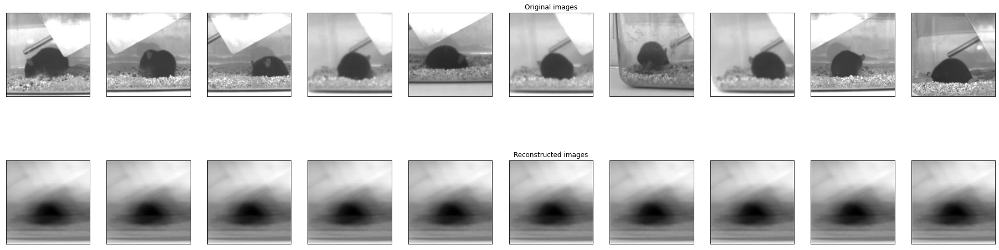

In [161]:
# P3C_ResNet18_croppedVAE_e50_vL36680.862097889185.p
vae.load_state_dict(torch.load("P3C_ResNet18_croppedVAE_e50_vL36680.862097889185.p"))
plot_ae_outputs(vae)

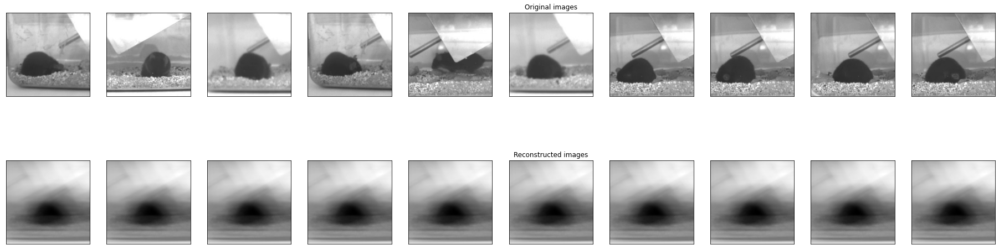

In [180]:
# P3C_ResNet18_croppedVAE_e100_vL106778.3619547151.p
vae.load_state_dict(torch.load("P3C_ResNet18_croppedVAE_e100_vL106778.3619547151.p"))
plot_ae_outputs(vae)

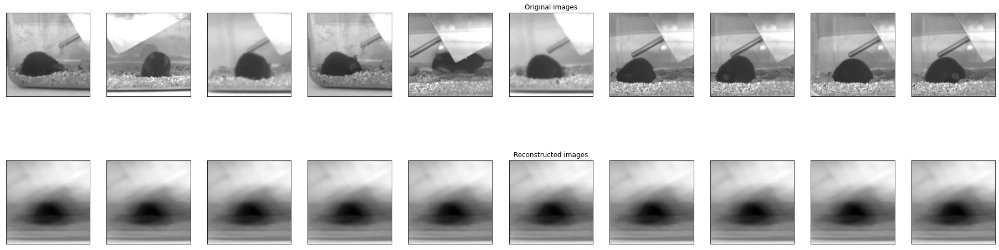

In [181]:
#Half Beta
# P3C_ResNet18_croppedVAEHalfBeta_e25_vL2.3092102613300085.p
vae.load_state_dict(torch.load("P3C_ResNet18_croppedVAEHalfBeta_e25_vL2.3092102613300085.p"))
plot_ae_outputs(vae)

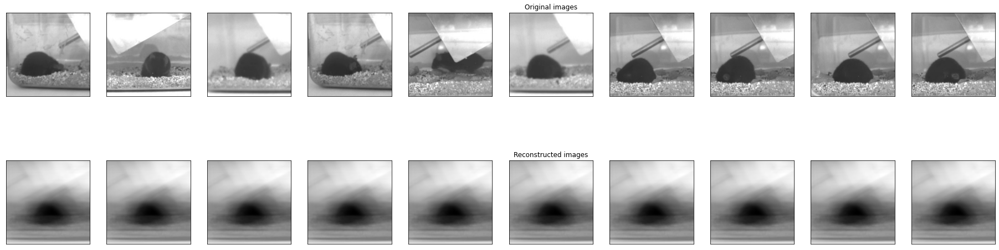

In [182]:
vae.load_state_dict(torch.load("P3C_ResNet18_croppedVAEHalfBeta_e150_vL3.1566532030701637.p"))
plot_ae_outputs(vae)

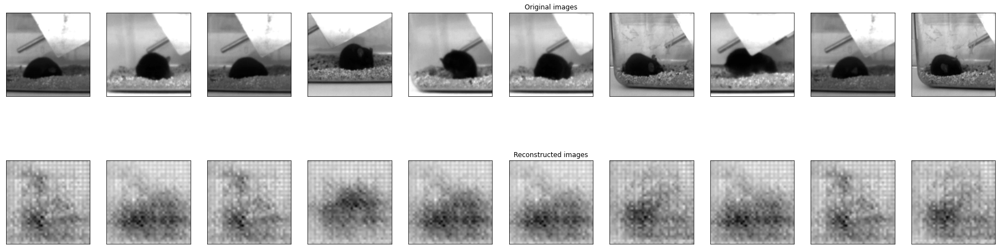

In [110]:
# BCE-AE
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAEBCE_e50_vL3676841.5.p"))
plot_ae_outputs(vae)

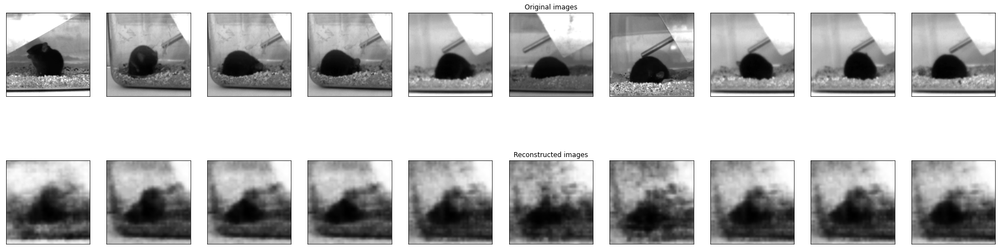

In [170]:
# ResNet18_1CNorm_croppedAEBCE_e1000_vL-5717227.0.p# BCE-AE
vae.load_state_dict(torch.load("ResNet18_1CNorm_croppedAEBCE_e1000_vL-5717227.0.p"))
plot_ae_outputs(vae)

In [164]:
# AE No Norm Expt 5
class ResizeConv2d(nn.Module):

    def __init__(self, in_channels, out_channels, kernel_size, scale_factor, mode='nearest'):
        super().__init__()
        self.scale_factor = scale_factor
        self.mode = mode
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=1)

    def forward(self, x):
        x = F.interpolate(x, scale_factor=self.scale_factor, mode=self.mode)
        x = self.conv(x)
        return x

class BasicBlockEnc(nn.Module):

    def __init__(self, in_planes, stride=1):
        super().__init__()

        planes = in_planes*stride

        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        if stride == 1:
            self.shortcut = nn.Sequential()
        else:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = torch.relu(out)
        return out

class BasicBlockDec(nn.Module):

    def __init__(self, in_planes, stride=1):
        super().__init__()

        planes = int(in_planes/stride)

        self.conv2 = nn.Conv2d(in_planes, in_planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(in_planes)
        # self.bn1 could have been placed here, but that messes up the order of the layers when printing the class

        if stride == 1:
            self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
            self.bn1 = nn.BatchNorm2d(planes)
            self.shortcut = nn.Sequential()
        else:
            self.conv1 = ResizeConv2d(in_planes, planes, kernel_size=3, scale_factor=stride)
            self.bn1 = nn.BatchNorm2d(planes)
            self.shortcut = nn.Sequential(
                ResizeConv2d(in_planes, planes, kernel_size=3, scale_factor=stride),
                nn.BatchNorm2d(planes)
            )

    def forward(self, x):
        out = torch.relu(self.bn2(self.conv2(x)))
        out = self.bn1(self.conv1(out))
        out += self.shortcut(x)
        out = torch.relu(out)
        return out

class ResNet18Enc(nn.Module):

    def __init__(self, z_dim=128):
        super(ResNet18Enc, self).__init__()
        self.z_dim = z_dim
        self.ResNet18 = models.resnet18(pretrained=True)
        self.num_features = self.ResNet18.fc.in_features
        print(self.num_features)
#         self.ResNet18.fc = nn.Linear(self.num_features, 2*self.z_dim)
        self.ResNet18.fc = nn.Linear(self.num_features, 2*self.z_dim)

    def forward(self, x):
        x = self.ResNet18(x)
        mu = x[:, :self.z_dim]
        logvar = x[:, self.z_dim:]
        return mu, logvar

class ResNet18Dec(nn.Module):

    def __init__(self, num_Blocks=[2,2,2,2], z_dim=10, nc=1):
        super().__init__()
        self.in_planes = 512

        self.linear = nn.Linear(z_dim, 512)

        self.layer4 = self._make_layer(BasicBlockDec, 256, num_Blocks[3], stride=2)
        self.layer3 = self._make_layer(BasicBlockDec, 128, num_Blocks[2], stride=2)
        self.layer2 = self._make_layer(BasicBlockDec, 64, num_Blocks[1], stride=2)
        self.layer1 = self._make_layer(BasicBlockDec, 64, num_Blocks[0], stride=1)
        self.conv1 = ResizeConv2d(64, nc, kernel_size=3, scale_factor=2)

    def _make_layer(self, BasicBlockDec, planes, num_Blocks, stride):
        strides = [stride] + [1]*(num_Blocks-1)
        layers = []
        for stride in reversed(strides):
            layers += [BasicBlockDec(self.in_planes, stride)]
        self.in_planes = planes
        return nn.Sequential(*layers)

    def forward(self, z):
        x = self.linear(z)
        x = x.view(z.size(0), 512, 1, 1)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer4(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer3(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer2(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer1(x)
        x = F.interpolate(x, size=(112,112), mode='bilinear')
        x = torch.sigmoid(self.conv1(x))
        x = x.view(x.size(0), 1, 224, 224)
        return x

class VAE(nn.Module):

    def __init__(self, z_dim):
        super().__init__()
        self.encoder = ResNet18Enc(z_dim=z_dim)
        self.decoder = ResNet18Dec(z_dim=z_dim)

    def forward(self, x):
#         print("Args", len(self.encoder(x)))
#         print("EncO/P:", self.encoder(x))
        mean, logvar = self.encoder(x)
        z = self.reparameterize(mean, logvar)
        r = self.decoder(z)
        return r, mean, logvar

    @staticmethod
    def reparameterize(mean, logvar):
        std = torch.exp(logvar / 2) # in log-space, squareroot is divide by two
        epsilon = torch.randn_like(std)
#         print("E:", epsilon.shape)
#         print("Std:", std.shape)
#         print("Mean:", mean.shape)
        return epsilon * std + mean

zsize = 256
vae = VAE(zsize)
vae = nn.DataParallel(vae)
vae = vae.cuda()

512


In [166]:
# AE
class ResNet_VAE(nn.Module):
    def __init__(self, fc_hidden1=1024, fc_hidden2=768, drop_p=0.3, CNN_embed_dim=128):
        super(ResNet_VAE, self).__init__()

        self.fc_hidden1, self.fc_hidden2, self.CNN_embed_dim = fc_hidden1, fc_hidden2, CNN_embed_dim
 
        # CNN architechtures
        self.ch1, self.ch2, self.ch3, self.ch4 = 16, 32, 64, 128
        self.k1, self.k2, self.k3, self.k4 = (5, 5), (3, 3), (3, 3), (3, 3)      # 2d kernal size
        self.s1, self.s2, self.s3, self.s4 = (2, 2), (2, 2), (2, 2), (2, 2)      # 2d strides
        self.pd1, self.pd2, self.pd3, self.pd4 = (0, 0), (0, 0), (0, 0), (0, 0)  # 2d padding

        # encoding components
        resnet = models.resnet18(pretrained=True)
        modules = list(resnet.children())[:-1]      # delete the last fc layer.
        conv1_weight = modules[0].weight # getting the weights of conv1
        modules[0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False) # Convert 3C to 1C
        modules[0].weight = nn.Parameter(torch.mean(conv1_weight, dim=1, keepdim=True))
        self.resnet = nn.Sequential(*modules)
        self.fc1 = nn.Linear(resnet.fc.in_features, self.fc_hidden1)
        self.bn1 = nn.BatchNorm1d(self.fc_hidden1, momentum=0.01)
        self.fc2 = nn.Linear(self.fc_hidden1, self.fc_hidden2)
        self.bn2 = nn.BatchNorm1d(self.fc_hidden2, momentum=0.01)
        # Latent vectors mu and sigma
        self.fc3_mu = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)      # output = CNN embedding latent variables
        self.fc3_logvar = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)  # output = CNN embedding latent variables

        # Sampling vector
        self.fc4 = nn.Linear(self.CNN_embed_dim, self.fc_hidden2)
        self.fc_bn4 = nn.BatchNorm1d(self.fc_hidden2)
        self.fc5 = nn.Linear(self.fc_hidden2, 64 * 4 * 4)
        self.fc_bn5 = nn.BatchNorm1d(64 * 4 * 4)
        self.relu = nn.ReLU(inplace=True)

        # Decoder
        self.convTrans6 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=self.k4, stride=self.s4,
                               padding=self.pd4),
            nn.BatchNorm2d(32, momentum=0.01),
            nn.ReLU(inplace=True),
        )
        self.convTrans7 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=32, out_channels=8, kernel_size=self.k3, stride=self.s3,
                               padding=self.pd3),
            nn.BatchNorm2d(8, momentum=0.01),
            nn.ReLU(inplace=True),
        )

        self.convTrans8 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=self.k2, stride=self.s2,
                               padding=self.pd2),
            nn.BatchNorm2d(1, momentum=0.01),
            nn.Sigmoid()    # y = (y1, y2, y3) \in [0 ,1]^3
        )


    def encode(self, x):
        x = self.resnet(x)  # ResNet
        x = x.view(x.size(0), -1)  # flatten output of conv

        # FC layers
        x = self.bn1(self.fc1(x))
        x = self.relu(x)
        x = self.bn2(self.fc2(x))
        x = self.relu(x)
        # x = F.dropout(x, p=self.drop_p, training=self.training)
        mu  = self.fc3_mu(x) # self.fc3_logvar(x)
        return mu

    def reparameterize(self, mu, logvar):
        if self.training:
            std = logvar.mul(0.5).exp_()
            eps = Variable(std.data.new(std.size()).normal_())
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode(self, z):
        x = self.relu(self.fc_bn4(self.fc4(z)))
        x = self.relu(self.fc_bn5(self.fc5(x))).view(-1, 64, 4, 4)
        x = self.convTrans6(x)
        x = self.convTrans7(x)
        x = self.convTrans8(x)
        x = F.interpolate(x, size=(224, 224), mode='bilinear')
        return x

    def forward(self, x):
        mu = self.encode(x)
        #z = self.reparameterize(mu, logvar)
        x_reconst = self.decode(mu)

        return x_reconst

CNN_fc_hidden1, CNN_fc_hidden2 = 1024, 1024
CNN_embed_dim = 128   # z-size
res_size = 224        # ResNet image size
dropout_p = 0.2
vae = ResNet_VAE(fc_hidden1=CNN_fc_hidden1, fc_hidden2=CNN_fc_hidden2, drop_p=dropout_p, CNN_embed_dim=CNN_embed_dim)
vae = nn.DataParallel(vae)
vae = vae.cuda()

In [177]:
# VAE
class ResizeConv2d(nn.Module):

    def __init__(self, in_channels, out_channels, kernel_size, scale_factor, mode='nearest'):
        super().__init__()
        self.scale_factor = scale_factor
        self.mode = mode
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=1)

    def forward(self, x):
        x = F.interpolate(x, scale_factor=self.scale_factor, mode=self.mode)
        x = self.conv(x)
        return x

class BasicBlockEnc(nn.Module):

    def __init__(self, in_planes, stride=1):
        super().__init__()

        planes = in_planes*stride

        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        if stride == 1:
            self.shortcut = nn.Sequential()
        else:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = torch.relu(out)
        return out

class BasicBlockDec(nn.Module):

    def __init__(self, in_planes, stride=1):
        super().__init__()

        planes = int(in_planes/stride)

        self.conv2 = nn.Conv2d(in_planes, in_planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(in_planes)
        # self.bn1 could have been placed here, but that messes up the order of the layers when printing the class

        if stride == 1:
            self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
            self.bn1 = nn.BatchNorm2d(planes)
            self.shortcut = nn.Sequential()
        else:
            self.conv1 = ResizeConv2d(in_planes, planes, kernel_size=3, scale_factor=stride)
            self.bn1 = nn.BatchNorm2d(planes)
            self.shortcut = nn.Sequential(
                ResizeConv2d(in_planes, planes, kernel_size=3, scale_factor=stride),
                nn.BatchNorm2d(planes)
            )

    def forward(self, x):
        out = torch.relu(self.bn2(self.conv2(x)))
        out = self.bn1(self.conv1(out))
        out += self.shortcut(x)
        out = torch.relu(out)
        return out

class ResNet18Enc(nn.Module):

    def __init__(self, z_dim=128):
        super(ResNet18Enc, self).__init__()
        self.z_dim = z_dim
        self.ResNet18 = models.resnet18(pretrained=True)
        self.num_features = self.ResNet18.fc.in_features
        print(self.num_features)
#         self.ResNet18.fc = nn.Linear(self.num_features, 2*self.z_dim)
        self.ResNet18.fc = nn.Linear(self.num_features, 2*self.z_dim)

    def forward(self, x):
        x = self.ResNet18(x)
        mu = x[:, :self.z_dim]
        logvar = x[:, self.z_dim:]
        return mu, logvar

class ResNet18Dec(nn.Module):

    def __init__(self, num_Blocks=[2,2,2,2], z_dim=10, nc=1):
        super().__init__()
        self.in_planes = 512

        self.linear = nn.Linear(z_dim, 512)

        self.layer4 = self._make_layer(BasicBlockDec, 256, num_Blocks[3], stride=2)
        self.layer3 = self._make_layer(BasicBlockDec, 128, num_Blocks[2], stride=2)
        self.layer2 = self._make_layer(BasicBlockDec, 64, num_Blocks[1], stride=2)
        self.layer1 = self._make_layer(BasicBlockDec, 64, num_Blocks[0], stride=1)
        self.conv1 = ResizeConv2d(64, nc, kernel_size=3, scale_factor=2)

    def _make_layer(self, BasicBlockDec, planes, num_Blocks, stride):
        strides = [stride] + [1]*(num_Blocks-1)
        layers = []
        for stride in reversed(strides):
            layers += [BasicBlockDec(self.in_planes, stride)]
        self.in_planes = planes
        return nn.Sequential(*layers)

    def forward(self, z):
        x = self.linear(z)
        x = x.view(z.size(0), 512, 1, 1)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer4(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer3(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer2(x)
        x = F.interpolate(x, scale_factor=2)
        x = self.layer1(x)
        x = F.interpolate(x, size=(112,112), mode='bilinear')
        x = torch.sigmoid(self.conv1(x))
        x = x.view(x.size(0), 1, 224, 224)
        return x

class VAE(nn.Module):

    def __init__(self, z_dim):
        super().__init__()
        self.encoder = ResNet18Enc(z_dim=z_dim)
        self.decoder = ResNet18Dec(z_dim=z_dim)

    def forward(self, x):
#         print("Args", len(self.encoder(x)))
#         print("EncO/P:", self.encoder(x))
        mean, logvar = self.encoder(x)
        z = self.reparameterize(mean, logvar)
        r = self.decoder(z)
        return r, mean, logvar
    
    @staticmethod
    def reparameterize(mean, logvar):
        std = torch.exp(logvar / 2) # in log-space, squareroot is divide by two
        epsilon = torch.randn_like(std)
#         print("E:", epsilon.shape)
#         print("Std:", std.shape)
#         print("Mean:", mean.shape)
        return epsilon * std + mean

zsize = 256
vae = VAE(zsize)
vae = nn.DataParallel(vae)
vae = vae.cuda()

512


In [172]:
# P1C Norm VAE
class ResNet_VAE(nn.Module):
    def __init__(self, fc_hidden1=1024, fc_hidden2=768, drop_p=0.3, CNN_embed_dim=128):
        super(ResNet_VAE, self).__init__()

        self.fc_hidden1, self.fc_hidden2, self.CNN_embed_dim = fc_hidden1, fc_hidden2, CNN_embed_dim

        # CNN architechtures
        self.ch1, self.ch2, self.ch3, self.ch4 = 16, 32, 64, 128
        self.k1, self.k2, self.k3, self.k4 = (5, 5), (3, 3), (3, 3), (3, 3)      # 2d kernal size
        self.s1, self.s2, self.s3, self.s4 = (2, 2), (2, 2), (2, 2), (2, 2)      # 2d strides
        self.pd1, self.pd2, self.pd3, self.pd4 = (0, 0), (0, 0), (0, 0), (0, 0)  # 2d padding

        # encoding components
        resnet = models.resnet152(pretrained=True)
        modules = list(resnet.children())[:-1]      # delete the last fc layer.
        modules[0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False) # Convert 3C to 1C
        self.resnet = nn.Sequential(*modules)
        self.fc1 = nn.Linear(resnet.fc.in_features, self.fc_hidden1)
        self.bn1 = nn.BatchNorm1d(self.fc_hidden1, momentum=0.01)
        self.fc2 = nn.Linear(self.fc_hidden1, self.fc_hidden2)
        self.bn2 = nn.BatchNorm1d(self.fc_hidden2, momentum=0.01)
        # Latent vectors mu and sigma
        self.fc3_mu = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)      # output = CNN embedding latent variables
        self.fc3_logvar = nn.Linear(self.fc_hidden2, self.CNN_embed_dim)  # output = CNN embedding latent variables

        # Sampling vector
        self.fc4 = nn.Linear(self.CNN_embed_dim, self.fc_hidden2)
        self.fc_bn4 = nn.BatchNorm1d(self.fc_hidden2)
        self.fc5 = nn.Linear(self.fc_hidden2, 64 * 4 * 4)
        self.fc_bn5 = nn.BatchNorm1d(64 * 4 * 4)
        self.relu = nn.ReLU(inplace=True)

        # Decoder
        self.convTrans6 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=self.k4, stride=self.s4,
                               padding=self.pd4),
            nn.BatchNorm2d(32, momentum=0.01),
            nn.ReLU(inplace=True),
        )
        self.convTrans7 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=32, out_channels=8, kernel_size=self.k3, stride=self.s3,
                               padding=self.pd3),
            nn.BatchNorm2d(8, momentum=0.01),
            nn.ReLU(inplace=True),
        )

        self.convTrans8 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=self.k2, stride=self.s2,
                               padding=self.pd2),
            nn.BatchNorm2d(1, momentum=0.01),
            nn.Sigmoid()    # y = (y1, y2, y3) \in [0 ,1]^3
        )


    def encode(self, x):
        x = self.resnet(x)  # ResNet
        x = x.view(x.size(0), -1)  # flatten output of conv

        # FC layers
        x = self.bn1(self.fc1(x))
        x = self.relu(x)
        x = self.bn2(self.fc2(x))
        x = self.relu(x)
        # x = F.dropout(x, p=self.drop_p, training=self.training)
        mu, logvar = self.fc3_mu(x), self.fc3_logvar(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        if self.training:
            std = logvar.mul(0.5).exp_()
            eps = Variable(std.data.new(std.size()).normal_())
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode(self, z):
        x = self.relu(self.fc_bn4(self.fc4(z)))
        x = self.relu(self.fc_bn5(self.fc5(x))).view(-1, 64, 4, 4)
        x = self.convTrans6(x)
        x = self.convTrans7(x)
        x = self.convTrans8(x)
        x = F.interpolate(x, size=(224, 224), mode='bilinear')
        return x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        x_reconst = self.decode(z)

        return x_reconst, z, mu, logvar

CNN_fc_hidden1, CNN_fc_hidden2 = 1024, 1024
CNN_embed_dim = 128   # z-size
res_size = 224        # ResNet image size
dropout_p = 0.2
vae = ResNet_VAE(fc_hidden1=CNN_fc_hidden1,
                 fc_hidden2=CNN_fc_hidden2, 
                 drop_p=dropout_p, 
                 CNN_embed_dim=CNN_embed_dim)
vae = nn.DataParallel(vae)
vae = vae.cuda()

In [51]:
vae.module.resnet.layers

AttributeError: 'Sequential' object has no attribute 'layers'

In [113]:
predicted_datapoints = pd.read_hdf("/media/data_cifs/anagara8/NIH_Spine_Annotation/Iteration1 Annotations/video_2018Y_08M_17D_12h_03m_17s_cam_17202338-0000DLC_resnet50_NIH_Spine_AnnotationAug26shuffle1_100000.h5")

In [114]:
predicted_datapoints

scorer    DLC_resnet50_NIH_Spine_AnnotationAug26shuffle1_100000              \
bodyparts                                                  Nose               
coords                                                        x           y   
0                                                 577.463379     403.175323   
1                                                 577.461182     403.181244   
2                                                 577.505920     403.174866   
3                                                 577.487427     403.092163   
4                                                 577.473816     403.108185   
...                                                      ...            ...   
107995                                            146.527390     414.537872   
107996                                            146.544250     414.517609   
107997                                            146.456360     414.430695   
107998                                            146.418655     414.465942   
107999                                            146.529007     414.512970   

scorer                                                               \
bodyparts               InnerEar                             Spine1   
coords    likelihood           x           y likelihood           x   
0           0.999849  560.578369  361.944366   0.999902  543.134460   
1           0.999853  560.544495  361.830139   0.999910  543.195984   
2           0.999839  560.878845  361.985565   0.999905  543.001526   
3           0.999829  560.940979  361.853882   0.999910  542.708679   
4           0.999825  560.985107  361.868103   0.999908  542.687317   
...              ...         ...         ...        ...         ...   
107995      0.999637  150.263412  376.679321   0.999880  172.376068   
107996      0.999634  150.223373  376.626984   0.999882  172.245712   
107997      0.999620  150.048920  376.648376   0.999883  172.138046   
107998      0.999615  150.015350  376.607269   0.999885  172.212616   
107999      0.999620  150.054764  376.586151   0.999884  172.161270   

scorer                                                               \
bodyparts                             Spine2                          
coords              y likelihood           x           y likelihood   
0          348.022980   0.999504  511.191223  345.426392   0.999600   
1          347.908905   0.999549  511.368469  345.465302   0.999609   
2          347.773193   0.999543  511.393341  345.208923   0.999623   
3          347.624268   0.999551  511.214996  345.519318   0.999627   
4          347.436249   0.999496  511.272858  345.472046   0.999586   
...               ...        ...         ...         ...        ...   
107995     364.542664   0.999380  207.808365  359.764771   0.996884   
107996     364.456299   0.999366  207.858109  359.773560   0.996898   
107997     364.528168   0.999385  207.796753  359.757416   0.996848   
107998     364.487244   0.999388  207.888016  359.867065   0.996900   
107999     364.451324   0.999399  207.773178  359.856720   0.996832   

scorer                                                                \
bodyparts      Spine3                          TailStart               
coords              x           y likelihood           x           y   
0          492.366699  357.517975   0.997715  481.421875  389.236023   
1          492.474060  357.380585   0.997805  481.450531  389.063446   
2          490.753662  361.153503   0.997605  481.234222  388.999176   
3          490.721100  361.071991   0.997487  481.295959  388.936401   
4          492.343262  357.196808   0.997575  481.150818  388.663239   
...               ...         ...        ...         ...         ...   
107995     230.129990  384.055481   0.998316  233.827408  413.919220   
107996     230.178665  384.064209   0.998294  233.844238  413.891052   
107997     230.177490  384.025452   0.998327  233.921463  413.820496   
107998     230.178741  384.154144   0.9

In [115]:
datapoints = pd.read_hdf("/media/data_cifs/anagara8/NIH_Spine_Annotation/NIH_Spine_Annotation-Akash-2022-08-26/labeled-data/video_2018Y_08M_17D_12h_03m_17s_cam_17202338-0000/CollectedData_Akash.h5")
datapoints

scorer                                                                             Akash  \
bodyparts                                                                           Nose   
coords                                                                                 x   
labeled-data video_2018Y_08M_17D_12h_03m_17s_cam_17202338-0000 img000795.png  146.391827   
                                                               img001458.png  154.866736   
                                                               img001799.png  197.241280   
                                                               img003254.png  514.579531   
                                                               img004100.png  551.304135   
...                                                                                  ...   
                                                               img91884.png   172.480737   
                                                               img92283.png   166.623507   
                                                               img94876.png   170.807243   
                                                               img98244.png   147.378323   
                                                               img9842.png    242.767498   

scorer                                                                                    \
bodyparts                                                                                  
coords                                                                                 y   
labeled-data video_2018Y_08M_17D_12h_03m_17s_cam_17202338-0000 img000795.png  422.831110   
                                                               img001458.png  394.581414   
                                                               img001799.png  359.740122   
                                                               img003254.png  382.339879   
                                                               img004100.png  364.448405   
...                                                                                  ...   
                                                               img91884.png   424.232851   
                                                               img92283.png   422.559357   
                                                               img94876.png   422.559357   
                                                               img98244.png   420.885862   
                                                               img9842.png    405.824414   

scorer                                                                                    \
bodyparts                                                                       InnerEar   
coords                                                                                 x   
labeled-data video_2018Y_08M_17D_12h_03m_17s_cam_17202338-0000 img000795.png  149.216797   
                                                               img001458.png  166.166614   
                                                               img001799.png  181.233119   
                                                               img003254.png  528.704379   
                                                               img004100.png  523.996096   
...                                                                                  ...   
                                                               img91884.png   134.827116   
                                                               img92283.png   136.500610   
                                                               img94876.png   137.337357   
                                                               img98244.png   149.051817   
                                                               img9842.png    229.379543   

scorer                                                                                    \
bodyparts                                

In [138]:
int(datapoints.iloc[0].name[-1].split(".png")[0].split("img")[-1])

795